## **Task 2** - Computer Vision & IOT: Color Identification
+ **Creative Space:** Using Open-cv & K-means clustering, segmenting an unlabeled territory map by color.

**Author: Ramsis Hammadi**

---
As an IOT/Computer Visions Intern at the Graduate Rotational Internship program (GRIP) by The Sparks Foundation (TSF), the second task is to **implement a color detector** which **identifies all the colors in an image/video.**

For more learning purposes, I've utilized this feature in **segmenting unlabeled territory maps by color and recognizing each part**. 

# **Dependencies**




<h5>
<li>scikit library
<li>skimage
<li>Open-cv
<li>numpy
<h5>


---
Using the K-means unsurpvised approach to create clusters from common colors and identify them.

Open-cv for Image Processing

Numpy for arithmetic operations on arrays in order to aggregate results.


In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from collections import Counter
from skimage.color import rgb2lab, deltaE_cie76
import os

%matplotlib inline

The type of this input is <class 'numpy.ndarray'>
Shape: (1050, 1400, 3)


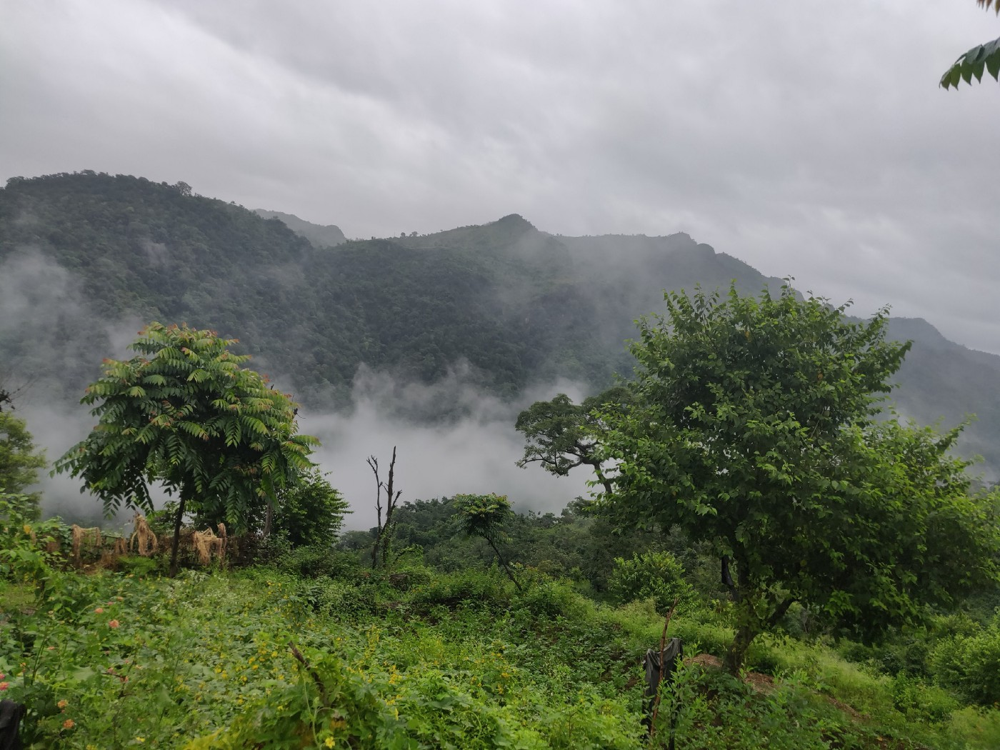

In [ ]:
image = cv2.imread('sampled.jpeg')
print("The type of this input is {}".format(type(image)))
print("Shape: {}".format(image.shape))
cv2_imshow(image)

## Output
# The type of this input is <class 'numpy.ndarray'>
# Shape: (3456, 4608, 3)

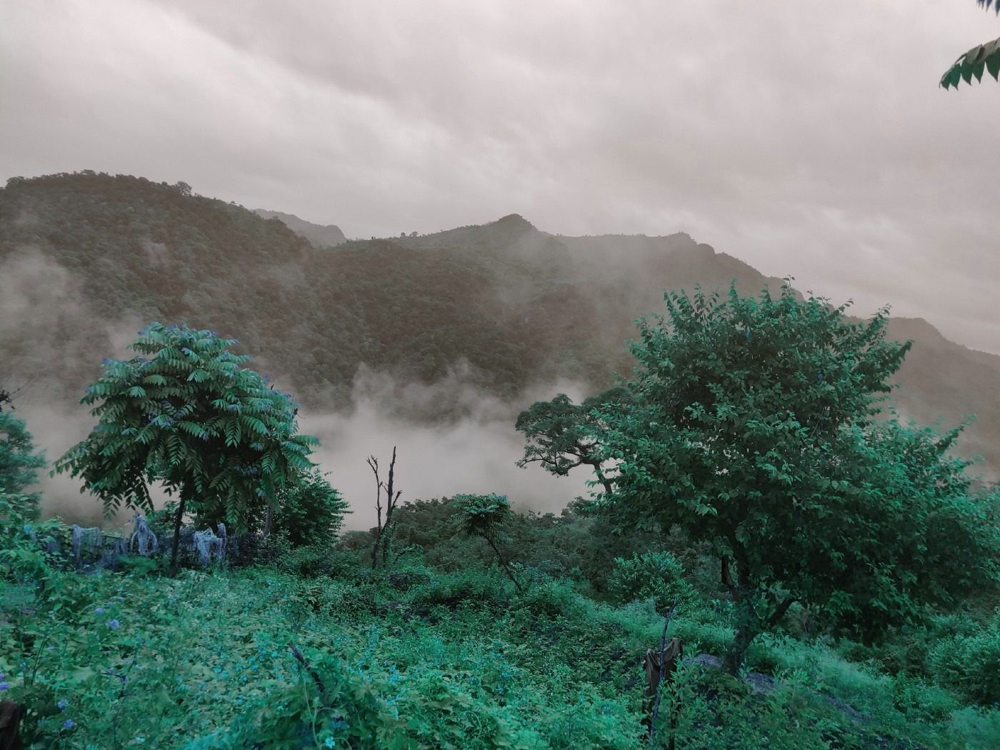

In [ ]:
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
cv2_imshow(image)

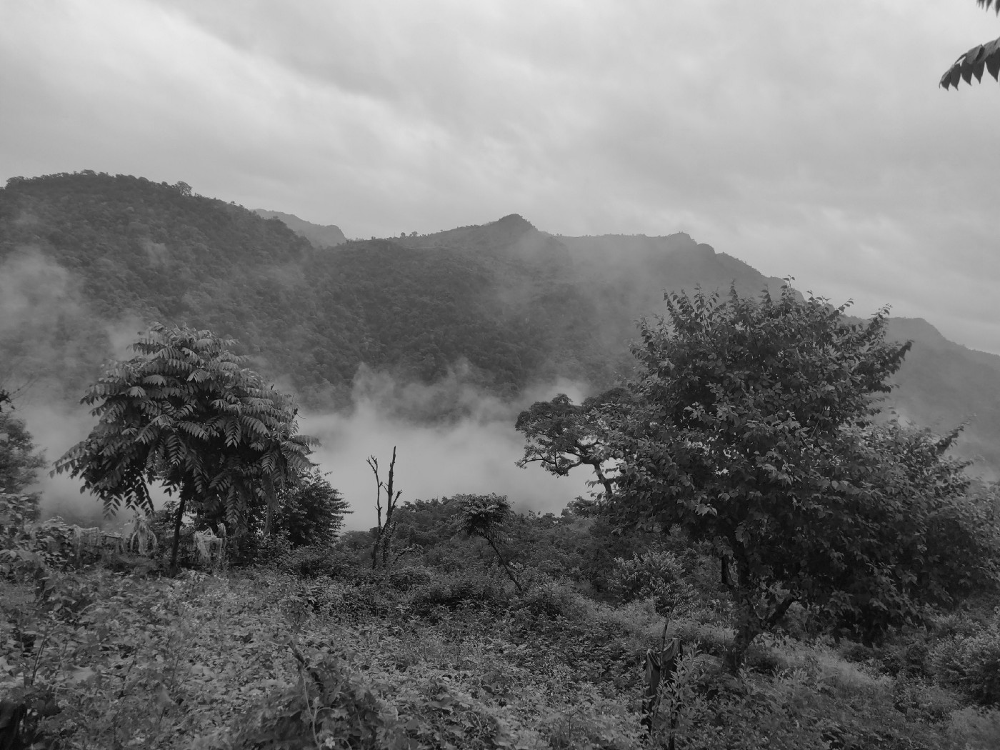

In [ ]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

In [ ]:
def RGB2HEX(color):
    return "#{:02x}{:02x}{:02x}".format(int(color[0]), int(color[1]), int(color[2]))

In [ ]:
def get_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

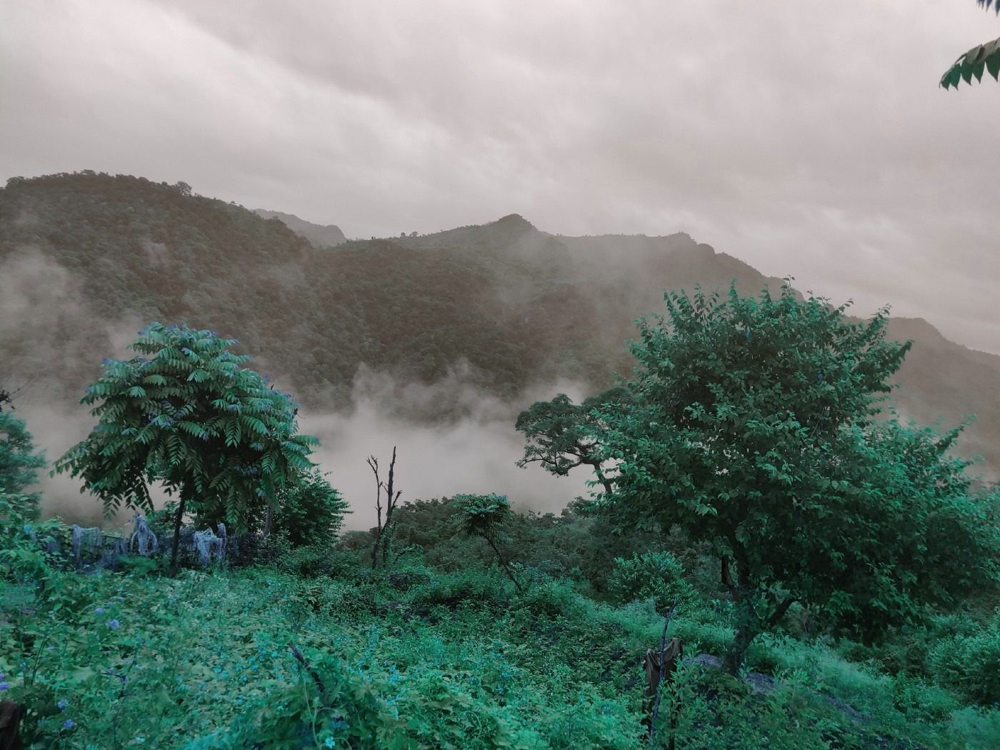

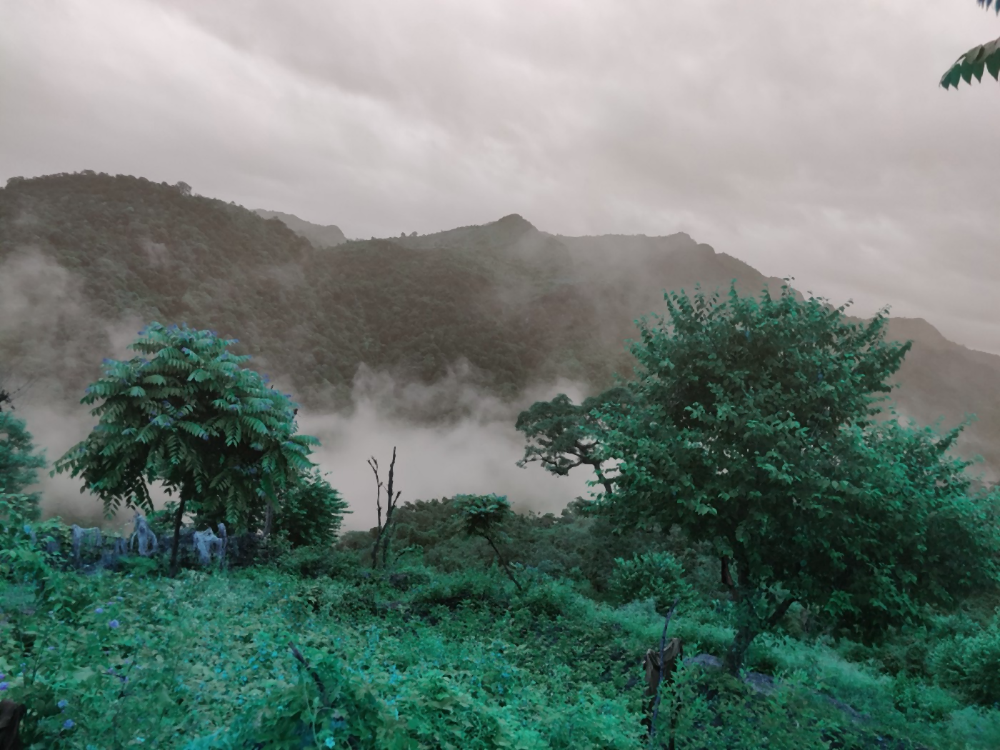

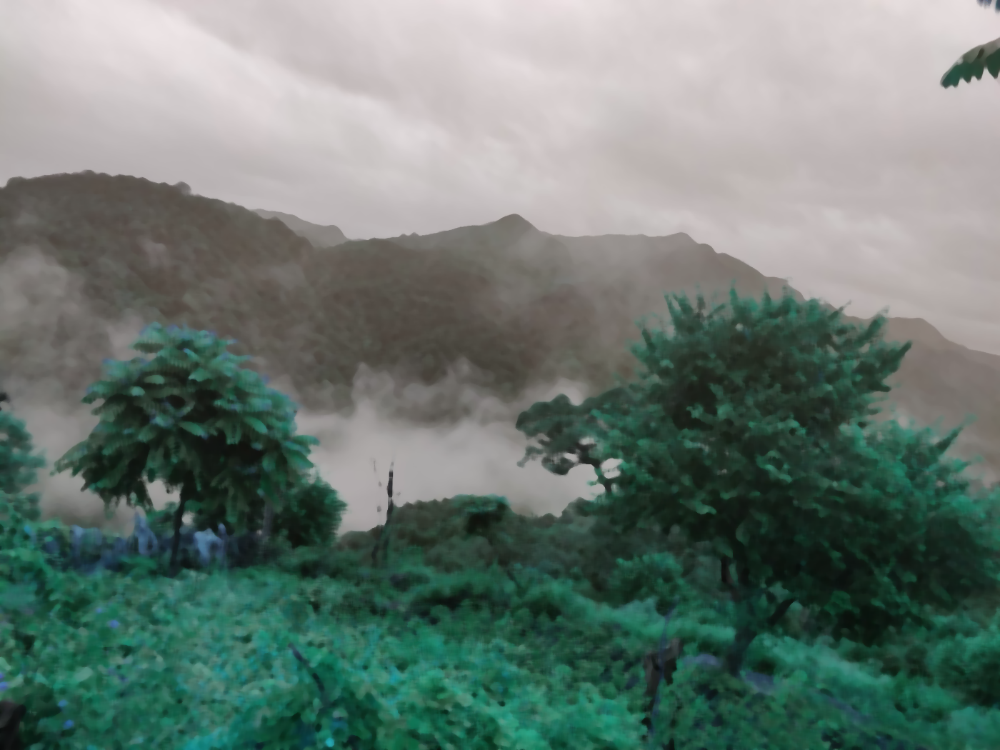

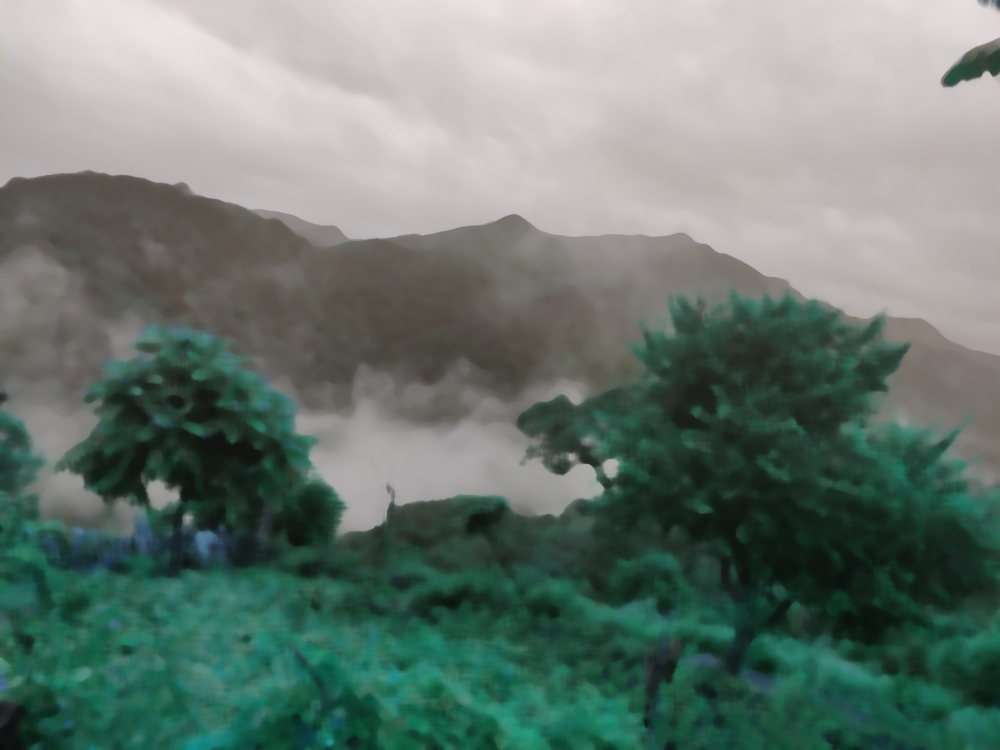

In [ ]:
cv2_imshow(image)
for k in (3, 9, 15):
	# apply a "median" blur to the image
	blurred = cv2.medianBlur(image, k)
	cv2_imshow( blurred)

In [ ]:
modified_image = cv2.resize(image, (600, 400), interpolation = cv2.INTER_AREA)
modified_image = modified_image.reshape(modified_image.shape[0]*modified_image.shape[1], 3)

([<matplotlib.patches.Wedge at 0x7f8431e61d90>,
 [Text(1.0422371430660307, 0.3517694381460084, '#b1b2b9'),
  Text(0.5840138559238949, 0.9321629772142339, '#1c2513'),
  Text(0.0914573387939567, 1.0961913862007526, '#6e7373'),
  Text(-0.3261819559132163, 1.0505262165394202, '#354120'),
  Text(-0.8772612285017722, 0.6636359973415861, '#4c5d25'),
  Text(-1.0984084575056499, -0.059151166345718945, '#d4d3db'),
  Text(-0.7910804107205025, -0.7643243969508505, '#c3c3cb'),
  Text(0.0040604521555621725, -1.0999925057600586, '#505758'),
  Text(0.7822439141749779, -0.7733656694838542, '#6b7b37'),
  Text(1.0745041381558622, -0.2354588224847989, '#8d8f90')])

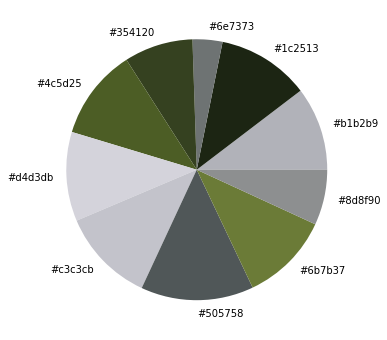

In [ ]:
clf = KMeans(n_clusters = 10)
labels = clf.fit_predict(modified_image)

counts = Counter(labels)

center_colors = clf.cluster_centers_
# We get ordered colors by iterating through the keys
ordered_colors = [center_colors[i] for i in counts.keys()]
hex_colors = [RGB2HEX(ordered_colors[i]) for i in counts.keys()]
rgb_colors = [ordered_colors[i] for i in counts.keys()]


plt.figure(figsize = (8, 6))
plt.pie(counts.values(), labels = hex_colors, colors = hex_colors)


In [ ]:
def get_colors(img, number_of_colors, show_chart):
  
  resized_image = cv2.resize(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), (1200, 600))
  modified_image = resized_image.reshape(resized_image.shape[0] * resized_image.shape[1], 3)

  km = KMeans(n_clusters = 10)
  labels = km.fit_predict(modified_image)

  count = Counter(labels)
  centers = km.cluster_centers_

  
  rgb_colors = [centers[i] for i in count.keys()]
  hex_colors = [RGB2HEX(centers[i]) for i in count.keys()]

  if show_chart:
    plt.figure(figsize = (8, 6))
    plt.pie(counts.values(), labels = hex_colors, colors = hex_colors)

  return rgb_colors

In [ ]:
def check_for_common_colors(image, colors, threshold = 60, number_of_colors = 10):
  image_colors = get_colors(image, number_of_colors, False)
  colors_found = []
  for color_id, color in colors.items():
    selected_color =  rgb2lab(np.uint8(np.asarray([[color]])))
    for i in range(number_of_colors):
        curr_color = rgb2lab(np.uint8(np.asarray([[image_colors[i]]])))
        diff = deltaE_cie76(selected_color, curr_color)
       
        if (diff < threshold):
            colors_found.append(color_id)
            break
  return colors_found

In [ ]:
COLORS = {
    'GREEN': [0, 128, 0],
    'BLUE': [0, 0, 128],
    'RED': [255, 0, 0],
    'YELLOW': [255, 255, 0],
    'WHITE': [0, 0, 0],
    'BLACK': [255, 255, 255],
    'PINK': [252, 15, 192]
    
}


In [ ]:
check_for_common_colors(blurred, COLORS)

['GREEN', 'WHITE', 'BLACK']

# Territory map segmentation and identifying regions by color
Using KMeans unsupervised approach, we can cluster common territory colors together and label them according to cluster center.
This way we can segment any territory map that depends on colors.

Needed different preprocessing approaches using open-cv to avoid inaccurate decisions.

The final result showed promising conclusions in terms of cluster territory area and labeling.

**Note:** This is an independent work, solely for learning purposes.
---Ramsis Hammadi

In [ ]:
#one-line function to seperate target territory from other territories
get_area = lambda x, y, z: z if (x == y) else np.array([0, 0, 0])


def dynamic_play(image_path):
  """
  This function will englobe all the work done to achieve the map segmentation/labeling.
  It went through the following phases:
    -Image preprocessing
    -fitting/prediction with Kmeans model
    -Optimizing labels accuracy using custom algorithms
    -creating a map legend with custom labels to the map given
    -seperating requested territory and showing only the area belonging to it
  """
  #Grabbing map
  image = cv2.imread(image_path)

  #The areas found in map
  areas = ['Algonquian','Siouan','Iroquoian','Uto-AztecanOther','Native American','Hawaiian','Latin','English','Spanish','Uncertain/Disputed']
  
  #Processing image to optimize the clusters radius
  blurred_image = cv2.medianBlur(image, 11)
  blurred_image = cv2.resize(blurred_image, (1200, 600))
  
  #Modifying image to match the Kmeans input shape
  testing_img = blurred_image.reshape(blurred_image.shape[0] * blurred_image.shape[1], 3)
  
  #Calling the K-Means with 10 clusters + Training/prediction
  clf = KMeans(n_clusters = 10)
  labels = clf.fit_predict(testing_img)

  #Extracting the clusters centers
  count = Counter(labels)
  centers = clf.cluster_centers_

  #Labeling each territory with a specific name
  for (key, val) in count.items():
    
    count[key] = (areas[key], val)

  #Removing the lined clusters that seperated the territories
  keys_del = []
  for key, val in count.items():
    if(val[1] < 10000):
      keys_del.append(key)
  for key in keys_del:
    count.pop(key)
  

  #matching the centers colors with int values to use them
  center_int = list(map(lambda x: (int(x[0]), int(x[1]), int(x[2])), centers))

  #Adding background space to create the legend
  add_black = np.zeros((image.shape[0], 200, 3))
  im = np.concatenate((image, add_black), axis = 1)
  
  #Creating a legend for the map with every territory with its color
  i = 150
  for key, val in count.items():
    i += 40
    color = center_int[key]
    cv2.putText(im, f'{key + 1} : {val[0]}', (950, i), cv2.FONT_HERSHEY_PLAIN, 1, color, 1, cv2.LINE_AA)
  cv2_imshow(im)
  print("Type down the territory number...")

  #Giving the user the option to extract the shape of one territory from the map
  test = False
  while(not test):
    try:
      territory_number = int(input("Territory n°..."))
      test = True
    except:
      print("INVALID NUMBER")
  #Extracting the territory requested
  area_name = areas[territory_number - 1]
  area = np.concatenate(list(map(get_area, labels, np.array([ territory_number - 1 for _ in range(labels.shape[0])]).astype('uint'), testing_img)))
  print(f'Area n°{territory_number}: {area_name}')
  #Reshaping the area since we've worked with a flat array 1-D
  img = area.reshape((600, 1200, 3)).astype('uint8')
  
  #Putting the area name in place
  cv2.putText(img, f'{area_name} Territory', (350, 40), cv2.FONT_HERSHEY_PLAIN, 2, center_int[territory_number - 1], 2, cv2.LINE_AA)
  #Showing the final result
  cv2_imshow(img)

  

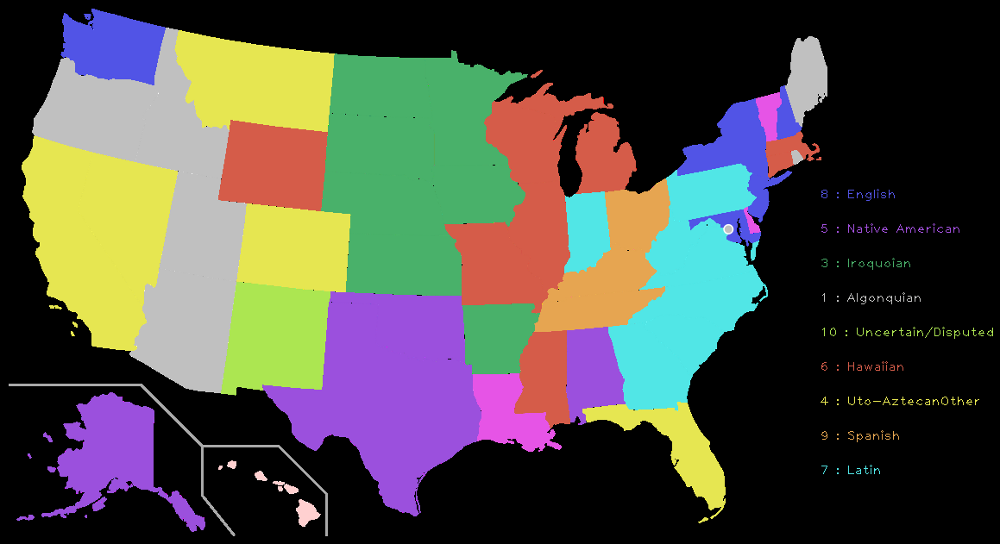

Type down the territory number...
Territory n°...8
Area n°8: English


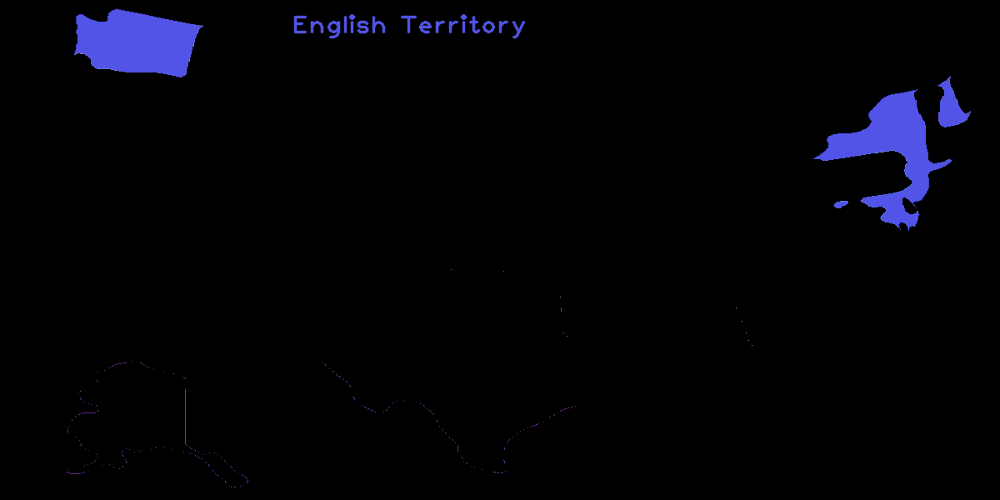

In [ ]:
dynamic_play('map3.png')

# **Thank you!**
---**Ramsis Hammadi**, Data Scientist & Competitive Programming Instructor.

If you wish to join the GRIP Program, do apply here:
https://internship.thesparksfoundation.info/ 